In [1]:
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt 
import seaborn as sns
import pymannkendall as mk
import pickle
import scipy

%matplotlib inline
%config InlineBackend.figure_format = 'png'

matplotlib.rcParams['font.size'] = 7
matplotlib.rcParams['figure.dpi'] = 600
# journal format
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Helvetica'
matplotlib.rcParams['mathtext.fontset'] = "custom"
matplotlib.rcParams['mathtext.it'] = "Helvetica:italic"
matplotlib.rcParams['mathtext.rm'] = "Helvetica"
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['font.size'] = 7

'''
Created by Xiwen Wang
xiwen_wang@smail.nju.edu.cn
2024/05/27
'''

'\nCreated by Xiwen Wang\nxiwen_wang@smail.nju.edu.cn\n2024/05/27\n'

# Functions

In [15]:
# add_equal_axes
import matplotlib.transforms as mtransforms
# This function is modified from https://bbs.06climate.com/forum.php?mod=viewthread&tid=101847
def add_equal_axes(ax, loc, pad=None, h_pad=None, v_pad=None, h_width=None, h_height=None, v_width=None, v_height=None,
                   ha='left', va='lower'):

    '''
    ax : Axes or array_like of Axes
    loc : {'left', 'right', 'bottom', 'top', 'lowerleft', 'upperleft', 'lowerright', 'upperright'}, 
            the location of new ax relative to old ax(es)
    pad : float, space between old and new axes
    width/height: float
        loc='left' or 'right', h_width is the width of new ax, h_height is the height of new ax (default to be the same as old ax)
        loc='bottom' or 'top', v_height is the height of new ax, v_width is the width of new ax (default to be the same as old ax
    ha: horizontal alignment, [left, right], only worked for loc=top/bottom
    va: vertical alignment, [lower, upper], only worked for loc=left/right
    '''

    # Get the size and location of input ax(es)
    axes = np.atleast_1d(ax).ravel()
    bbox = mtransforms.Bbox.union([ax.get_position() for ax in axes])

    # Height and width of original ax
    width = bbox.x1 - bbox.x0
    height = bbox.y1 - bbox.y0

    # New axes is equal to original ax
    if h_width is None:
        h_width = width
    if v_width is None:
        v_width = width
    if h_height is None:
        h_height = height
    if v_height is None:
        v_height = height

    if h_pad is None:
        h_pad = pad 
    if v_pad is None:
        v_pad = pad 

    # Determine the location and size of new ax
    if loc == 'left':
        x0_new = bbox.x0 - pad - h_width
        x1_new = x0_new + h_width
        if va == 'lower':
            y0_new = bbox.y0 
            y1_new = bbox.y0 + h_height
        elif va == 'upper':
            y1_new = bbox.y1 
            y0_new = bbox.y1 - h_height
    elif loc == 'right':
        x0_new = bbox.x1 + pad
        x1_new = x0_new + h_width
        if va == 'lower':
            y0_new = bbox.y0 
            y1_new = bbox.y0 + h_height
        elif va == 'upper':
            y1_new = bbox.y1 
            y0_new = bbox.y1 - h_height
    elif loc == 'bottom':
        if ha =='left':
            x0_new = bbox.x0
            x1_new = bbox.x0 + v_width
        elif ha == 'right':
            x1_new = bbox.x1
            x0_new = bbox.x1 - v_width
        y0_new = bbox.y0 - pad - v_height
        y1_new = y0_new + v_height
    elif loc == 'top':
        if ha =='left':
            x0_new = bbox.x0
            x1_new = bbox.x0 + v_width
        elif ha == 'right':
            x1_new = bbox.x1
            x0_new = bbox.x1 - v_width
        elif ha == 'center':
            x1_new = bbox.x1 - width*0.5 + v_width*0.5 
            x0_new = bbox.x1 - width*0.5 - v_width*0.5 
        y0_new = bbox.y1 + pad
        y1_new = y0_new + v_height
    elif loc == 'lowerleft':
        x0_new = bbox.x0 - h_pad - h_width
        x1_new = x0_new + h_width
        y0_new = bbox.y0 - height - v_pad
        y1_new = y0_new + v_height
    elif loc == 'upperleft':
        x0_new = bbox.x0 - h_pad - h_width
        x1_new = x0_new + h_width
        y0_new = bbox.y1 + v_pad
        y1_new = y0_new + v_height
    elif loc == 'lowerright':
        x0_new = bbox.x1 + h_pad
        x1_new = x0_new + h_width
        y0_new = bbox.y0 - height - v_pad
        y1_new = y0_new + v_height
    elif loc == 'upperright':
        x0_new = bbox.x1 + h_pad
        x1_new = x0_new + h_width
        y0_new = bbox.y1 + v_pad
        y1_new = y0_new + v_height

    # Create new ax
    fig = axes[0].get_figure()
    bbox_new = mtransforms.Bbox.from_extents(x0_new, y0_new, x1_new, y1_new)
    ax_new = fig.add_axes(bbox_new)
    return ax_new

In [16]:
# plot_basic
import cartopy.crs as ccrs
import cartopy
import matplotlib.colors as mcolors

proj = ccrs.PlateCarree()

def plot_basic(var=None, var_n=None, var_s=None, loc_vmin=None, loc_vmax=None, loc_cbar_title='', ax=None, \
               loc_cmap_name='RdBu_r', loc_cmap_lut=None, var_subset=None, lat_subset=None, lon_subset=None, \
                loc_s=2, loc_alpha=0.8, loc_linewidth=0.0, loc_edgecolor='k', loc_marker='o', \
                loc_cbar_on='vertical', loc_norm_on=False, loc_vcenter=None, \
                powerlimits=False, loc_cbar_format=None, loc_cmap=None):
    
    if ax is None:
        # fig, ax = plt.subplots(1, 1, figsize=(4, 2), subplot_kw={'projection':ccrs.Robinson(central_longitude=0)}, dpi=300) # or 150
        fig, ax = plt.subplots(1, 1, figsize=(4, 2), subplot_kw={'projection':proj}, dpi=600)

    ax.set_extent([-180, 180, -90, 90])
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.3,
        color='#bcbcbc',    # color
        linestyle='--',     # line stype
        x_inline = False,
        y_inline = False,
        xlocs = np.arange(-180, 180, 60),  # longitude line position
        ylocs = np.arange(-90, 90, 30),    # latitude line position
        # rotate_labels = False,           # rotate labels or not
        alpha = 0.3,                      # opacity of lines
        zorder=0,
    )
    gl.top_labels = False 
    gl.right_labels = False 

    ax.add_feature(cartopy.feature.LAND.with_scale('50m'), facecolor='#bcbcbc', edgecolor='none')

    if loc_cmap is None:
        loc_cmap = matplotlib.cm.get_cmap(loc_cmap_name, loc_cmap_lut) 

    if loc_norm_on and (loc_vcenter is not None) and (loc_vmin is not None) and (loc_vmax is not None):
        norm = mcolors.TwoSlopeNorm(vmin=loc_vmin, vcenter=loc_vcenter, vmax=loc_vmax)
        if var is not None:
            im1 = ax.scatter(
                x=lons,
                y=lats,
                c=var,
                cmap=loc_cmap,
                s=loc_s,
                alpha=loc_alpha,
                linewidth=loc_linewidth,
                marker=loc_marker,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor,
                norm=norm,
                # transform=ccrs.PlateCarree()
                )
        elif (var_n is not None) and (var_s is not None):
            im1 = ax.scatter(
                x=lons[cali_mask_north],
                y=lats[cali_mask_north],
                c=var_n,
                cmap=loc_cmap,
                s=loc_s,
                marker=loc_marker,
                alpha=loc_alpha,
                linewidth=loc_linewidth,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor,
                norm=norm,
                )
            im2 = ax.scatter(
                x=lons[cali_mask_south],
                y=lats[cali_mask_south],
                c=var_s,
                cmap=loc_cmap,
                s=loc_s,
                alpha=loc_alpha,
                marker=loc_marker,
                linewidth=loc_linewidth,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor,
                norm=norm,
            )
        elif (var_subset is not None) and (lat_subset is not None) and (lon_subset is not None):
            im1 = ax.scatter(
                x=lon_subset,
                y=lat_subset,
                c=var_subset,
                cmap=loc_cmap,
                s=loc_s,
                alpha=loc_alpha,
                marker=loc_marker,
                linewidth=loc_linewidth,
                norm=norm,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor)
        else:
            print('no valid coordinates or data found')
    elif loc_norm_on == False:
        if var is not None:
            im1 = ax.scatter(
                x=lons,
                y=lats,
                c=var,
                cmap=loc_cmap,
                vmin=loc_vmin,
                vmax=loc_vmax,
                s=loc_s,
                alpha=loc_alpha,
                linewidth=loc_linewidth,
                marker=loc_marker,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor,
                # transform=ccrs.PlateCarree()
                )
        elif (var_n is not None) and (var_s is not None):
            im1 = ax.scatter(
                x=lons[cali_mask_north],
                y=lats[cali_mask_north],
                c=var_n,
                cmap=loc_cmap,
                vmin=loc_vmin,
                vmax=loc_vmax,
                s=loc_s,
                marker=loc_marker,
                alpha=loc_alpha,
                linewidth=loc_linewidth,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor,
                )
            im2 = ax.scatter(
                x=lons[cali_mask_south],
                y=lats[cali_mask_south],
                c=var_s,
                cmap=loc_cmap,
                vmin=loc_vmin,
                vmax=loc_vmax,
                s=loc_s,
                alpha=loc_alpha,
                marker=loc_marker,
                linewidth=loc_linewidth,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor,
            )
        elif (var_subset is not None) and (lat_subset is not None) and (lon_subset is not None):
            im1 = ax.scatter(
                x=lon_subset,
                y=lat_subset,
                c=var_subset,
                cmap=loc_cmap,
                vmin=loc_vmin,
                vmax=loc_vmax,
                s=loc_s,
                alpha=loc_alpha,
                marker=loc_marker,
                linewidth=loc_linewidth,
                # linewidth=[0.02 if i<0.05 else np.nan for i in p_lswt_summ_yearmean],
                edgecolors=loc_edgecolor)  

    # if powerlimits:
    #     cbformat = matplotlib.ticker.ScalarFormatter()
    #     cbformat.set_powerlimits((-4,12))
    #     cbformat.set_useMathText(True)
        
    if loc_cbar_on == 'vertical':
        cbax = add_equal_axes(ax, 'right', 0.03, h_width=0.015)
        if powerlimits:
            cb = plt.colorbar(im1, cax=cbax, ax=ax, fraction=0.019, label=loc_cbar_title, format=loc_cbar_format)
            cb.formatter.set_powerlimits((-2,12))
            cb.formatter.set_useMathText(True)
            # This will deactivate scientific notaion and loc_cbar_format
            if loc_norm_on:
                cb.ax.set_yscale('linear')
        else:
            cb = plt.colorbar(im1, cax=cbax, ax=ax, fraction=0.019, label=loc_cbar_title, format=loc_cbar_format)
            if loc_norm_on:
                cb.ax.set_yscale('linear')
        return cbax
    elif loc_cbar_on == 'horizontal':
        cbax = add_equal_axes(ax, 'bottom', 0.05, v_height=0.02)
        cb = plt.colorbar(im1, cax=cbax, ax=ax, fraction=0.019, label=loc_cbar_title, orientation='horizontal', format=loc_cbar_format)
        cb.ax.set_xscale('linear')
        return cbax
    elif loc_cbar_on == False:
        return im1
# plot_basic(slope_lswt_ctl_cov, loc_cbar_on='vertical', powerlimits=True, loc_vmin=-0.0001, loc_vmax=0.0001)
# plot_basic(var_subset=contribution_summ[filter1], lat_subset=lats[filter1], lon_subset=lons[filter1], loc_marker='o', loc_cmap='coolwarm', loc_vmin=-100, loc_vmax=100)

In [89]:
# plot_scatter
from scipy.stats import gaussian_kde

def myNormalize(x):
    return (x-min(x))/(max(x)-min(x))

def plot_scatter(loc_ax, obs, sim, default=None, loc_title=None, loc_unit='\u00B0C', \
    loc_ylabel='Observation', loc_xlabel='CSFLake', loc_cmap='Spectral_r', \
    loc_label=None, loc_min=0, loc_max=35, loc_xy_spacing=10, loc_s=20, loc_cbar_format=None, \
        loc_cbar_on=None, loc_cbar_norm=True, loc_vmin=None, loc_vmax=None):
    
    if loc_ax is None:
        fig, loc_ax = plt.subplots(figsize=(3, 2.5), dpi=300)

    rmse = np.sqrt(np.nanmean((sim - obs) ** 2))
    cc = np.corrcoef(obs, sim)[0,1]
    # print(cc, rmse)
    xy = np.vstack([obs,sim])
    z = gaussian_kde(xy)(xy)
    if loc_cbar_norm:
        z = myNormalize(z)
    
    im = loc_ax.scatter(sim, obs, c=z, cmap=loc_cmap, alpha=0.7, vmin=loc_vmin, vmax=loc_vmax, s=loc_s, linewidths=0)
    if default:
        im2 = loc_ax.scatter(default, obs, edgecolors='k', linewidths=0.5, c='white')
    # loc_ax.set_xticks(np.arange(loc_min,loc_max+loc_xy_spacing,loc_xy_spacing))
    # loc_ax.set_yticks(np.arange(loc_min,loc_max+loc_xy_spacing,loc_xy_spacing))
    loc_ax.set_xlim([loc_min, loc_max])
    loc_ax.set_ylim([loc_min, loc_max])
    loc_ax.set_ylabel(loc_ylabel+' ({})'.format(loc_unit))
    loc_ax.set_xlabel(loc_xlabel+' ({})'.format(loc_unit))

    if loc_cbar_on == 'inside':
        cbar=plt.colorbar(
            im,
            shrink=1,
            orientation='vertical',
            extend='neither',
            ax=loc_ax,
            format=loc_cbar_format,
            pad=0.03, fraction=0.05, # change fraction with figure size
            )
        cbar.ax.set_title('Density')
    elif loc_cbar_on == True:
        pos_ax = loc_ax.get_position()
        cbaxes = loc_ax.get_figure().add_axes([(pos_ax.x0+pos_ax.width)*1.02, pos_ax.y0, 0.06*pos_ax.width, pos_ax.height]) #Add position (left, bottom, width, height)
        cbar = loc_ax.get_figure().colorbar(
            im, 
            ax=loc_ax,
            cax=cbaxes,
            orientation='vertical', 
            extend='neither',
            pad=0.04, 
            fraction=0.037, 
            label='Density'
            )     # rmse
    # for normal scatter plot
    # pad=0.015,
    # aspect=30,
    loc_ax.plot((0, 1), (0, 1), transform=loc_ax.transAxes, ls='--', label="1:1 line", c='silver', zorder=0)
    loc_ax.text(0.05, 0.9, '$n\ =\ {}$'.format(len(obs)), transform=loc_ax.transAxes)
    loc_ax.text(0.05, 0.8, '$r\ =\ {:.2f}$'.format(cc), transform=loc_ax.transAxes)
    loc_ax.text(0.05, 0.7, 'RMSE = {:.2f} {}'.format(rmse, loc_unit), transform=loc_ax.transAxes)
    # loc_ax.text(0.05, 0.6, '$R^2\ =\ {:.2f}$'.format(r2), transform=loc_ax.transAxes)
    loc_ax.set_title(loc_title)

    return im 

In [18]:
def cal_stats(x0, y0):
    x = x0*1
    y = y0*1
    # correlation
    x.columns = range(x.columns.size)
    y.columns = range(y.columns.size)
    cc = x.corrwith(y).values
    # rmse
    rmse = np.sqrt(np.nanmean((y - x) ** 2, axis=0))
    # r2_score
    # r2 = r2_score(x, y)
    return cc, rmse

In [19]:
# Adopted from https://stackoverflow.com/a/20528097/22838226
def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero.

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower offset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax / (vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highest point in the colormap's range.
          Defaults to 1.0 (no upper offset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap
my_magma = shiftedColorMap(matplotlib.cm.magma_r, stop=0.8)
# my_magma

In [20]:
def auto_label(*args, offset=0):
    labels = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
    for i, ax in enumerate(args):
        ax.annotate('{}'.format(labels[i]), xy=(0,1.02+offset), xycoords='axes fraction', weight="bold")  

In [26]:
# pdfpng
import os
def pdfpng(loc_fig, loc_fname, loc_path='../Results_HTE/PaperFigure/', loc_dpi=600):

    pdf_path_name = loc_path + loc_fname + '.pdf'
    # pdf_path_name = loc_path+'/pdf/'+loc_fname+'.pdf'
    png_path_name = loc_path+loc_fname  # 不加扩展名, pdftoppm会强制添加扩展名，导致重复

    loc_fig.savefig(pdf_path_name, bbox_inches='tight', transparent=False)
    # sudo rm /usr/local/lib/libz.so.1
    # sudo ln -s /lib/x86_64-linux-gnu/libz.so.1.2.11 /usr/local/lib/libz.so.1
    os.system('pdftoppm -png -r '+str(loc_dpi)+' '+pdf_path_name+' '+png_path_name)
    os.system('convert '+png_path_name+'-1.png'+' -trim '+png_path_name+'.png')
    os.system('rm '+png_path_name+'-1.png')

# Read data

In [21]:
# set data dir 
# datadir = './PaperData/'
datadir = '../Results_HTE/PaperData/'

In [22]:
# read lake information
cali_lake = pd.read_csv(datadir + 'lake_list.csv', index_col=0)
cali_lakeids = cali_lake.index.to_numpy()
lats = cali_lake['centroid_y'].to_numpy()
lons = cali_lake['centroid_x'].to_numpy()
cali_mask_north = np.where(lats>0)[0]
cali_mask_south = np.where(lats<0)[0]

# Plot 

## Figure 1

In [23]:
with open(datadir + 'LSWT_CTL.pkl', 'rb') as f:
    slope_lswt_ctl_yearmean, slope_lswt_ctl_summ_yearmean, global_lswt_ctl_yearmean, global_lswt_ctl_summ_yearmean = pickle.load(f)

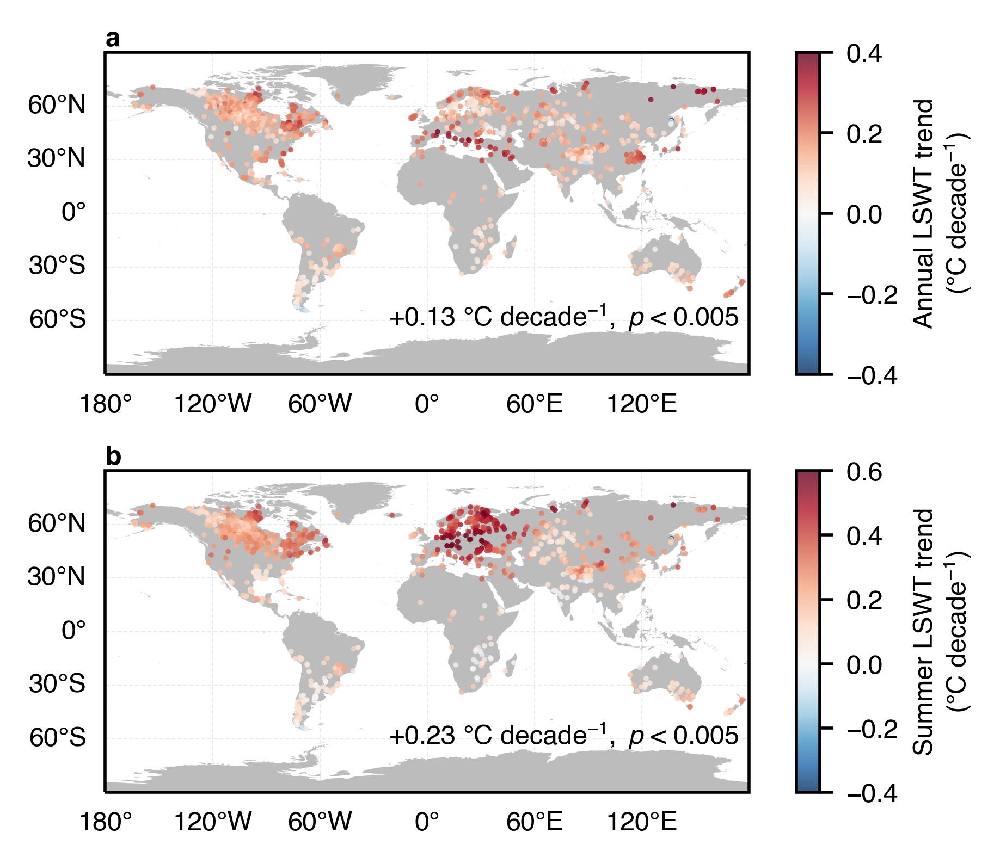

In [83]:
# start plotting
fig = plt.figure(figsize=(14.7/2.54, 9.15/2.54), dpi=500)
ax1 = plt.subplot(211, projection=proj)
ax2 = plt.subplot(212, projection=proj)
plt.subplots_adjust(hspace=0.3)

# linewidth1 = np.array([0.05 if p_lswt_ctl_yearmean[i]<0.05 else 0. for i in range(len(cali_lakeids))])
# linewidth2 = np.array([0.05 if p_lswt_ctl_summ_yearmean[i]<0.05 else 0. for i in range(len(cali_lakeids))])
linewidth1 = 0.
linewidth2 = 0.
plot_basic(slope_lswt_ctl_yearmean*10, loc_vmin=-0.4, loc_vmax=0.4, ax=ax1, \
           loc_linewidth=linewidth1, loc_cbar_title='Annual LSWT trend\n(\u00B0C decade$^{-1}$)')
plot_basic(slope_lswt_ctl_summ_yearmean*10, loc_vmin=-0.4, loc_vmax=0.6, \
           loc_vcenter=0, loc_norm_on=True, ax=ax2, loc_linewidth=linewidth2,\
             loc_cbar_title='Summer LSWT trend\n(\u00B0C decade$^{-1}$)')

tmpmk = mk.original_test(global_lswt_ctl_yearmean-273.15)
# print(tmpmk[2])
# ax3 = add_equal_axes(ax1, 'right', 0.22, h_width=0.4)
# ax3.plot(np.arange(1979,2023), global_lswt_ctl_yearmean-273.15, linewidth=1, c=pal[-2])
# ax3.plot(np.arange(1979,2023), tmpmk[7]*np.arange(0,2023-1979)+tmpmk[8], alpha=0.45, linewidth=2.2, c=pal[-2])
# ax3.set_ylabel('Annual mean LSWT (\u00B0C)',)
# ax3.annotate(
#     '{:+.2f} '.format(tmpmk[7]*10) + '\u00B0C decade$^{-1},\ p$ < 0.005',
#     xy=(0.37, 0.05), xycoords='axes fraction',
#     color=pal[-2]
#     )
ax1.annotate(
    '{:+.2f} '.format(tmpmk[7]*10) + '\u00B0C decade$^{-1},\ p$ < 0.005',
    xy=(0.44, 0.15), xycoords='axes fraction',
    )

tmpmk = mk.original_test(global_lswt_ctl_summ_yearmean-273.15)
# print(tmpmk[2])
# ax4 = add_equal_axes(ax2, 'right', 0.22, h_width=0.4)
# ax4.plot(np.arange(1979,2023), global_lswt_ctl_summ_yearmean-273.15, linewidth=1, c=pal[-2])
# ax4.plot(np.arange(1979,2023), tmpmk[7]*np.arange(0,2023-1979)+tmpmk[8], alpha=0.45, linewidth=2.2, c=pal[-2])
# ax4.set_ylabel('Summer mean LSWT (\u00B0C)',)
# ax4.annotate(
#     '{:+.2f} '.format(tmpmk[7]*10) + '\u00B0C decade$^{-1},\ p$ < 0.005',
#     xy=(0.37, 0.05), xycoords='axes fraction',
#     color=pal[-2]
#     )
ax2.annotate(
    '{:+.2f} '.format(tmpmk[7]*10) + '\u00B0C decade$^{-1},\ p$ < 0.005',
    xy=(0.44, 0.15), xycoords='axes fraction',
    )
auto_label(ax1, ax2,)
# auto_label(ax1, ax3, ax2, ax4)

pdfpng(fig, 'fig1')

## Figure 2

In [37]:
with open(datadir + 'HTEs.pkl', 'rb') as f:
    slope_hot_days_annual_count, slope_hot_days_annual_intensity, global_hot_days_annual_count, global_hot_days_annual_intensity = pickle.load(f)

2.0006092338320514e-09 4.610770692359267e-06


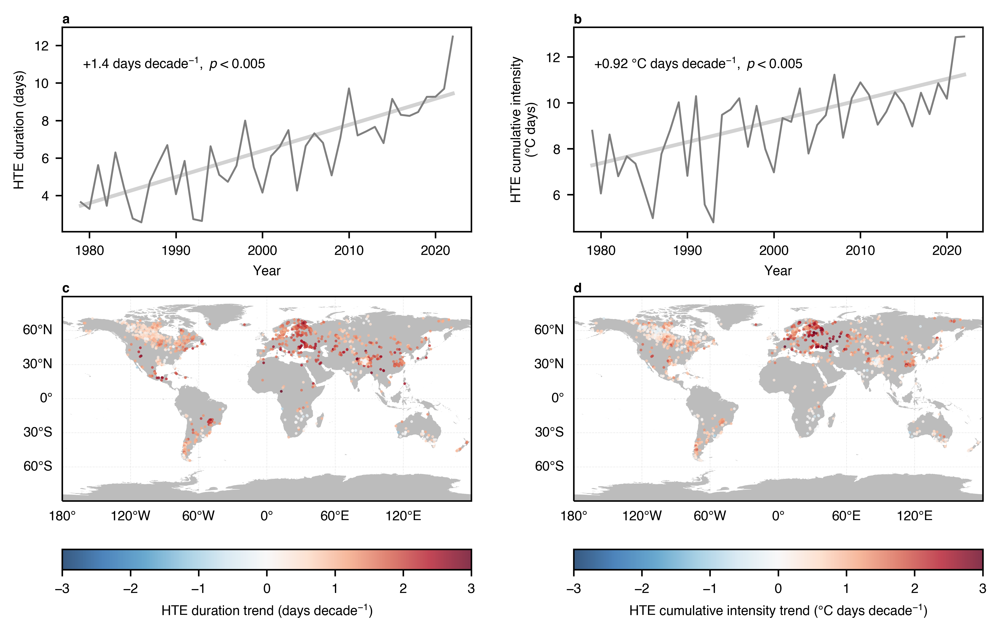

In [45]:
# clim (1979-2022) and trend
tmppal = sns.color_palette('deep')
fig = plt.figure(figsize=(22/2.54, 15/2.54))
ax2 = plt.subplot(223, projection=proj)
ax4 = plt.subplot(224, projection=proj)
plt.subplots_adjust(wspace=0.25, hspace=0.3)
# linewidth1 = np.array([0.05 if p_hot_days_annual_count[i]<0.05 else 0. for i in range(len(cali_lakeids))])
# linewidth2 = np.array([0.05 if p_hot_days_annual_intensity[i]<0.05 else 0. for i in range(len(cali_lakeids))])
linewidth1 = 0
linewidth2 = 0
im2 = plot_basic(slope_hot_days_annual_count*10, ax=ax2, loc_cbar_title='HTE duration trend (days decade$^{-1}$)', \
    loc_s=2, loc_linewidth=linewidth1, loc_vmin=-3, loc_vmax=3, loc_cbar_on=False)
im4 = plot_basic(slope_hot_days_annual_intensity*10, ax=ax4, loc_cbar_title='HTE cumulative intensity trend (\u00B0C days decade$^{-1}$)', \
   loc_s=2, loc_linewidth=linewidth2, loc_vmin=-3, loc_vmax=3, loc_cbar_on=False)

cbax1 = add_equal_axes(ax2, 'bottom', 0.06, v_height=0.025,)
plt.colorbar(im2, cbax1, ax2, orientation='horizontal', label='HTE duration trend (days decade$^{-1}$)')

cbax2 = add_equal_axes(ax4, 'bottom', 0.06, v_height=0.025,)
plt.colorbar(im2, cbax2, ax4, orientation='horizontal', label='HTE cumulative intensity trend (\u00B0C days decade$^{-1}$)')

# ax1 = plt.subplot(221, projection=proj)
# ax2 = plt.subplot(222, projection=proj)
# plot_basic(hot_days_annual_count.mean(axis=0), ax=ax1, loc_cmap_name='Spectral_r', loc_s=2, loc_cbar_title='Mean HTE duration (days)', loc_cbar_on='horizontal')
# plot_basic(hot_days_annual_intensity.mean(axis=0), ax=ax2, loc_vmin=0, loc_vmax=15, loc_cmap_name='Spectral_r', loc_s=2, loc_cbar_title='Mean HTE intensity (\u00B0C day)', loc_cbar_on='horizontal')

tmpmk = mk.original_test(global_hot_days_annual_count)
tmpmk2 = mk.original_test(global_hot_days_annual_intensity)
print(tmpmk[2], tmpmk2[2])

ax1 = add_equal_axes(ax2, 'top', 0.08)
ax1.plot(np.arange(1979,2023), global_hot_days_annual_count, c='tab:gray', linewidth=1)
ax1.plot(np.arange(1979,2023), tmpmk[7]*np.arange(0,2023-1979)+tmpmk[8], alpha=0.35, linewidth=2, c='tab:gray')
ax1.set_ylabel('HTE duration (days)',)
ax1.set_xlabel('Year')
ax1.annotate(
    '{:+.1f} '.format(tmpmk[7]*10) + 'days decade$^{-1},\ p$ < 0.005',
    xy=(0.05, 0.8), xycoords='axes fraction',
    color='k'
    )

ax3 = add_equal_axes(ax4, 'top', 0.08)
ax3.plot(np.arange(1979,2023), global_hot_days_annual_intensity, c='tab:gray', linewidth=1)
ax3.plot(np.arange(1979,2023), tmpmk2[7]*np.arange(0,2023-1979)+tmpmk2[8], alpha=0.35, linewidth=2, c='tab:gray')
ax3.set_ylabel('HTE cumulative intensity\n(\u00B0C days)',)
ax3.set_xlabel('Year')
ax3.annotate(
    '{:+.2f} '.format(tmpmk2[7]*10) + '\u00B0C days decade$^{-1},\ p$ < 0.005',
    xy=(0.05, 0.8), xycoords='axes fraction',
    color='k'
    )

auto_label(ax1, ax3, ax2, ax4)
pdfpng(fig, 'fig2')
pass;

## Figure 3

In [46]:
with open(datadir + 'linear_regression_contribution.pkl', 'rb') as f:
    p_x1, p_x2, linear_model_score, estimated_trend_p, p_lswt_ctl_summ_yearmean, estimated_trend, slope_lswt_ctl_summ_yearmean = pickle.load(f)

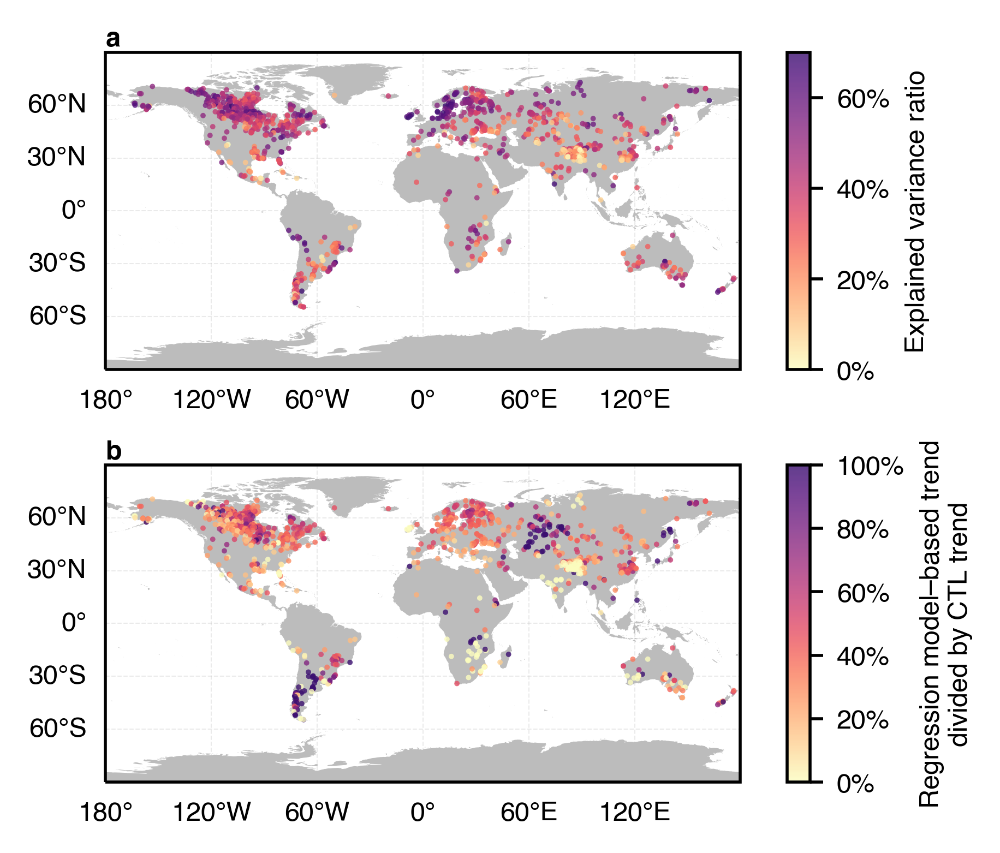

In [67]:
fig = plt.figure(figsize=(14.4/2.54, 9/2.54), dpi=500)
plt.subplots_adjust(hspace=0.3)

ax1 = plt.subplot(211, projection=proj)
im1 = plot_basic(linear_model_score*100, ax=ax1, loc_vmin=0, loc_vmax=70, loc_cbar_on=False, loc_cmap=my_magma)
cbax = add_equal_axes(ax1, 'right', 0.03, h_width=0.015,)
# cbax = add_equal_axes(ax1, 'bottom', 0.05, v_height=0.025,)
plt.colorbar(im1, cbax, ax1, orientation='vertical', label='Explained variance ratio', format='%d%%')

# fig3_filter = p_lswt_ctl_summ_yearmean<0.05
# fig3_filter = (estimated_trend_p<0.05) & (p_lswt_ctl_summ_yearmean<0.05) & (estimated_trend!=0) & (slope_lswt_ctl_summ_yearmean!=0)
statistic_contribution = estimated_trend / slope_lswt_ctl_summ_yearmean
ax2 = plt.subplot(212, projection=proj)
# im1 = plot_basic(var_subset=statistic_contribution[fig3_filter]*100, \
#                  lat_subset=lats[fig3_filter], lon_subset=lons[fig3_filter], ax=ax2, loc_cmap_name='magma_r', loc_vmin=0, loc_vmax=100, loc_cbar_on=False)
im1 = plot_basic(statistic_contribution*100, ax=ax2, loc_cmap=my_magma, loc_vmin=0, loc_vmax=100, loc_cbar_on=False)
cbax = add_equal_axes(ax2, 'right', 0.03, h_width=0.015,)
# cbax = add_equal_axes(ax2, 'bottom', 0.05, v_height=0.025,)
plt.colorbar(im1, cbax, ax2, orientation='vertical', label='Regression model\u2013based trend\ndivided by CTL trend', format='%d%%')

auto_label(ax1, ax2)
pdfpng(fig, 'fig3')

## Figure 4 

In [47]:
with open(datadir + 'numerical_experiments_contribution.pkl', 'rb') as f:
    diff_summ_yearmean, slope_diff_summ_yearmean, p_diff_summ_yearmean, contribution_summ_lswt, \
        global_lswt_ctl_summ_yearmean, global_lswt_cft_summ_yearmean, \
            slope_lswt_ctl_summ_yearmean, slope_lswt_cft_summ_yearmean, \
                 p_lswt_ctl_summ_yearmean, p_lswt_cft_summ_yearmean = pickle.load(f)

4.987622674867964e-07 1.2678292409251668e-06
KstestResult(statistic=0.18333333333333332, pvalue=6.480950597871908e-19)


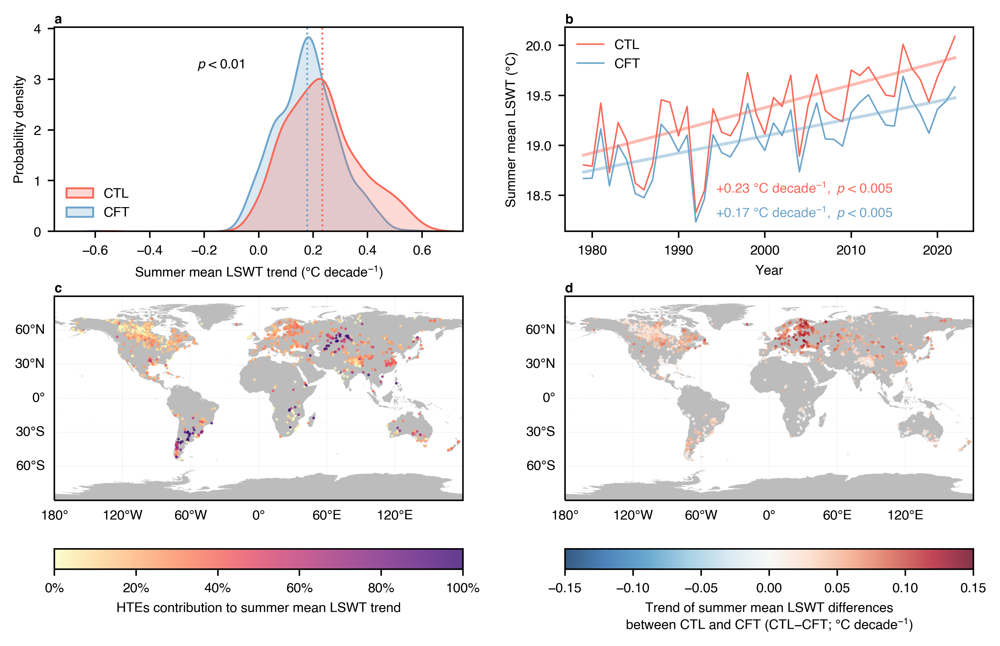

In [88]:
# fig4_filter0 = (p_lswt_ctl_summ_yearmean<0.05)   # CTL显著的湖泊
# fig4_filter1 = (p_lswt_cft_summ_yearmean<0.05)&(p_lswt_ctl_summ_yearmean<0.05)   # 筛选前后都显著的湖泊
# fig4_filter2 = (p_lswt_cft_summ_yearmean>0.05)&(p_lswt_ctl_summ_yearmean<0.05)   # CTL->CFT 显著->不显著
# fig4_filter0 = slope_lswt_ctl_summ_yearmean>0
# summary(contribution_summ_lswt[filter1])
# print(contribution_summ_lswt[filter1].shape, contribution_summ_lswt[filter2].shape)

fig = plt.figure(figsize=(21.95/2.54, 15/2.54), dpi=500)
plt.subplots_adjust(wspace=0.25, hspace=0.3)
# plt.subplots_adjust(wspace=0.3)

ax1 = plt.subplot(121, projection=proj)
im1 = plot_basic(contribution_summ_lswt, loc_marker='o', loc_cmap_name=my_magma, loc_vmin=0, loc_vmax=100, ax=ax1, loc_cbar_on=False)
# im1 = plot_basic(var_subset=contribution_summ_lswt[fig4_filter0], lat_subset=lats[fig4_filter0], \
    # lon_subset=lons[fig4_filter0], loc_marker='o', loc_cmap_name='magma_r', loc_cmap_lut=None, loc_vmin=0, loc_vmax=100, ax=ax1, loc_cbar_on=False)
# plot_basic(var_subset=contribution_summ_lswt[fig4_filter2], lat_subset=lats[fig4_filter2], lon_subset=lons[fig4_filter2], \
#     loc_marker='s', loc_cmap_name='magma_r', loc_cmap_lut=None, loc_vmin=0, loc_vmax=70, ax=ax1, \
#     loc_linewidth=0.1, loc_edgecolor='w', loc_cbar_on=False)
# cbax1 = add_equal_axes(ax1, 'right', 0.03, h_width=0.015,)
# plt.colorbar(im1, cbax1, ax1, orientation='vertical', label='Contribution', format='%d%%')
cbax1 = add_equal_axes(ax1, 'bottom', 0.06, v_height=0.025,)
plt.colorbar(im1, cbax1, ax1, orientation='horizontal', label='HTEs contribution to summer mean LSWT trend', format='%d%%')

# fig4_filter = (p_diff_summ_yearmean<0.05) 
ax2 = plt.subplot(122, projection=proj)
im1 = plot_basic(slope_diff_summ_yearmean*10, ax=ax2, loc_vmin=-0.15, loc_vcenter=0, \
                 loc_vmax=0.15, loc_cbar_on=False, loc_linewidth=0.)
# im1 = plot_basic(ax=ax2, var_subset=slope_diff_summ_yearmean[fig4_filter1|fig4_filter2]*10, lat_subset=lats[fig4_filter1|fig4_filter2], lon_subset=lons[fig4_filter1|fig4_filter2], loc_vmin=-0.2, loc_vmax=0.2, loc_cbar_on=False, loc_linewidth=0.08)
# plot_basic(ax=ax2, var_subset=slope_diff_summ_yearmean[fig4_filter1|fig4_filter2]*10, lat_subset=lats[fig4_filter1|fig4_filter2], lon_subset=lons[fig4_filter1|fig4_filter2], loc_vmin=-0.2, loc_vmax=0.2, loc_cbar_on=False)
# cbax = add_equal_axes(ax2, 'right', 0.03, h_width=0.015,)
# plt.colorbar(im1, cbax, ax2, orientation='vertical', label='Trend of differences (CTL-CFT)\n(\u00B0C decade$^{-1}$)')
cbax = add_equal_axes(ax2, 'bottom', 0.06, v_height=0.025,)
plt.colorbar(im1, cbax, ax2, orientation='horizontal', \
             label='Trend of summer mean LSWT differences\nbetween CTL and CFT (CTL$-$CFT; \u00B0C decade$^{-1}$)')

tmpmk = mk.original_test(global_lswt_ctl_summ_yearmean-273.15)
tmpmk2 = mk.original_test(global_lswt_cft_summ_yearmean-273.15)
print(tmpmk[2], tmpmk2[2])
ax4 = add_equal_axes(ax2, 'top', 0.08,)
ax4.plot(np.arange(1979,2023), global_lswt_ctl_summ_yearmean-273.15, linewidth=0.8, c='#fa6a59', label='CTL')
ax4.plot(np.arange(1979,2023), global_lswt_cft_summ_yearmean-273.15, linewidth=0.8, c='#6da5cc', label='CFT')
ax4.plot(np.arange(1979,2023), tmpmk[7]*np.arange(0,2023-1979)+tmpmk[8], alpha=0.45, linewidth=1.6, c='#fa6a59')
ax4.plot(np.arange(1979,2023), tmpmk2[7]*np.arange(0,2023-1979)+tmpmk2[8], alpha=0.45, linewidth=1.6, c='#6da5cc')
ax4.set_ylabel('Summer mean LSWT (\u00B0C)',)
ax4.set_xlabel('Year')
ax4.annotate(
    '{:+.2f} '.format(tmpmk[7]*10) + '\u00B0C decade$^{-1},\ p$ < 0.005',
    xy=(0.37, 0.19), xycoords='axes fraction',
    color='#fa6a59'
    )
ax4.annotate(
    '{:+.2f} '.format(tmpmk2[7]*10) + '\u00B0C decade$^{-1},\ p$ < 0.005',
    xy=(0.37, 0.07), xycoords='axes fraction',
    color='#6da5cc'
    )
ax4.legend(frameon=False)

ax3 = add_equal_axes(ax1, 'top', 0.08,)
# Kolmogorov-Smirnov test
print(scipy.stats.kstest(slope_lswt_ctl_summ_yearmean, slope_lswt_cft_summ_yearmean))  
ax3 = sns.kdeplot(slope_lswt_ctl_summ_yearmean*10, label='CTL', ax=ax3, color='#fa6a59', fill=True)
ax3 = sns.kdeplot(slope_lswt_cft_summ_yearmean*10, label='CFT', ax=ax3, color='#6da5cc', fill=True, zorder=0)
ax3.axvline(slope_lswt_ctl_summ_yearmean.mean()*10, c='#fa6a59', linestyle=':', linewidth=1.)
ax3.axvline(slope_lswt_cft_summ_yearmean.mean()*10, c='#6da5cc', linestyle=':', linewidth=1.)
# ax3.annotate('CTL: {:+.2f} \u00B0C decade'.format(slope_lswt_ctl_summ_yearmean.mean()*10) + '$^{-1}$', \
#             xy=(0.6, 0.85), xycoords='axes fraction', c=plt.cm.get_cmap('Set3').colors[3])
# ax3.annotate('CFT: {:+.2f} \u00B0C decade'.format(slope_lswt_cft_summ_yearmean.mean()*10) + '$^{-1}$', \
#             xy=(0.6, 0.7), xycoords='axes fraction', c=plt.cm.get_cmap('Set3').colors[4])
ax3.annotate('$p$ < 0.01', xy=(0.35, 0.8), xycoords='axes fraction')
ax3.legend(loc='lower left', frameon=False)
ax3.set_xlabel('Summer mean LSWT trend (\u00B0C decade$^{-1}$)')
ax3.set_ylabel('Probability density')
ax3.set_xlim([-0.75, 0.75])

auto_label(ax3, ax4, ax1, ax2)

pdfpng(fig, 'fig4')

## Figure E1

In [27]:
# plot_extFig1
from matplotlib.lines import Line2D
def plot_extFig1(var=None, loc_lats=lats, loc_lons=lons, ax=None, loc_s=3, loc_c='k',\
    loc_alpha=0.8, loc_linewidth=0.0, loc_marker='o'):
    ax.set_extent([-180, 180, -90, 90])
    ax.add_feature(cartopy.feature.LAND.with_scale('50m'), facecolor='#bcbcbc', edgecolor='none')
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.3,
        color='#bcbcbc',    # color
        linestyle='--',     # line stype
        x_inline = False,
        y_inline = False,
        xlocs = np.arange(-180, 180, 60),  # longitude line position
        ylocs = np.arange(-90, 90, 30),    # latitude line position
        # rotate_labels = False,           # rotate labels or not
        alpha = 0.3,                      # opacity of lines
        zorder=0,
    )
    gl.top_labels = False 
    gl.right_labels = False 
    im1 = ax.scatter(
        x=loc_lons,
        y=loc_lats,
        c=loc_c,
        s=loc_s,
        alpha=loc_alpha,
        linewidth=loc_linewidth,
        marker=loc_marker,
        )

In [28]:
# save([cali_lakeids, depth, area, elevation], 'study_sites')
with open(datadir + 'study_sites.pkl', 'rb') as f:
    cali_lakeids, depth, area, elevation = pickle.load(f)

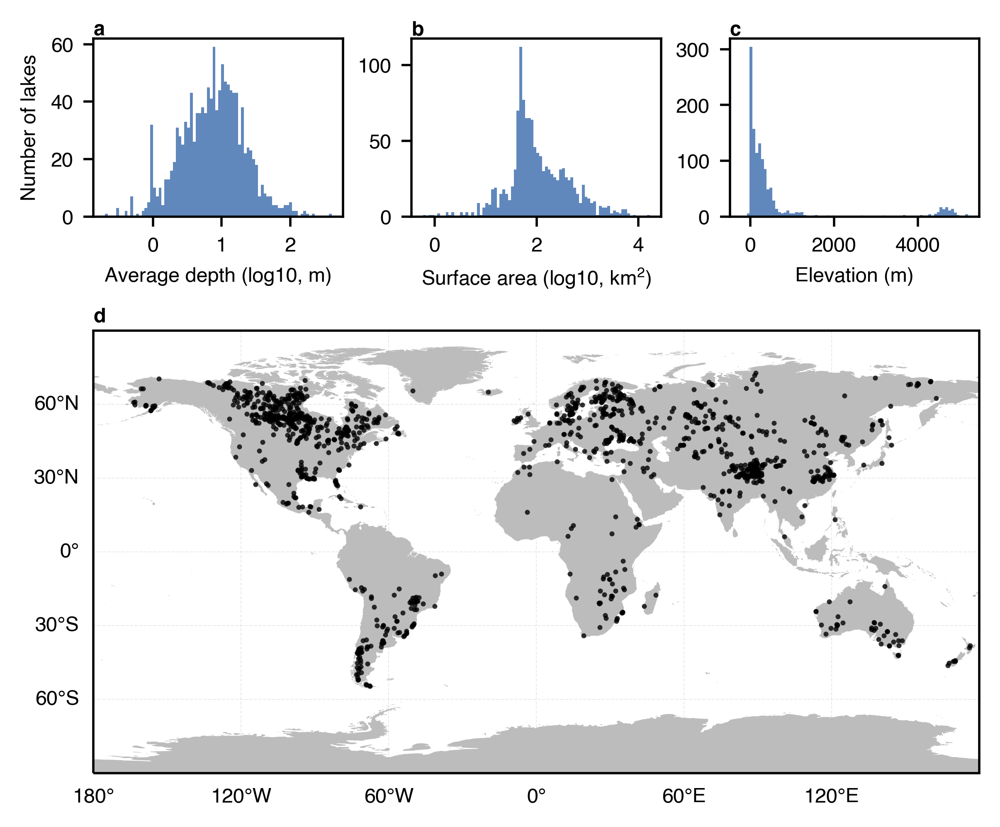

In [29]:
fig = plt.figure(figsize=(14/2.54, 10/2.54), dpi=500)
ax = plt.subplot(111, projection=proj)
plot_extFig1(cali_lakeids, ax=ax, loc_c='k')

# legend_lake_info = [
#     Line2D([0], [0], marker='o', color='none', 
#         markerfacecolor=thermalregion_info['color'].iloc[i], 
#         markeredgewidth=0., markersize=5,
#         label=thermalregion_info['region'].iloc[i]) for i in range(len(thermalregion_info))
#     ]
# ax.legend(handles=legend_lake_info, loc='lower left', bbox_to_anchor=(0.,-0.35), frameon=False, ncol=3)

bbox = ax.get_position()
width = bbox.x1 - bbox.x0
height = bbox.y1 - bbox.y0

h_pad = 0.06
v_pad = 0.14
new_width = (width-h_pad*2)/3
new_height = new_width
y0 = bbox.y1 + v_pad
y1 = bbox.y1 + v_pad + new_height
x0_1 = bbox.x0
x1_1 = x0_1 + new_width
x0_2 = x1_1 + h_pad
x1_2 = x0_2 + new_width
x0_3 = x1_2 + h_pad
x1_3 = x0_3 + new_width

ax1 = fig.add_axes(mtransforms.Bbox.from_extents(x0_1, y0, x1_1, y1))
ax2 = fig.add_axes(mtransforms.Bbox.from_extents(x0_2, y0, x1_2, y1))
ax3 = fig.add_axes(mtransforms.Bbox.from_extents(x0_3, y0, x1_3, y1))

ax1.hist(np.log10(depth), bins=80, facecolor='#1e56a0', alpha=0.7, linewidth=0.5)
ax2.hist(np.log10(area), bins=80, facecolor='#1e56a0', alpha=0.7, linewidth=0.5)
ax3.hist(elevation, bins=80, facecolor='#1e56a0', alpha=0.7, linewidth=0.5)

ax1.set_xlabel('Average depth '+r'(log10, m)')
ax1.set_ylabel('Number of lakes')
ax2.set_xlabel('Surface area '+r'(log10, km$^2$)')
ax3.set_xlabel('Elevation '+r'(m)')

auto_label(ax1, ax2, ax3, ax)

## Figure E2 

In [30]:
with open(datadir + 'LSWT_validation_cci.pkl', 'rb') as f:
    deflswt_metrics_annual, deflswt_metrics_north, deflswt_metrics_south, lswt_metrics_annual, \
      lswt_metrics_north, lswt_metrics_south, fsat_count_annual, fsat_count_summer = pickle.load(f)

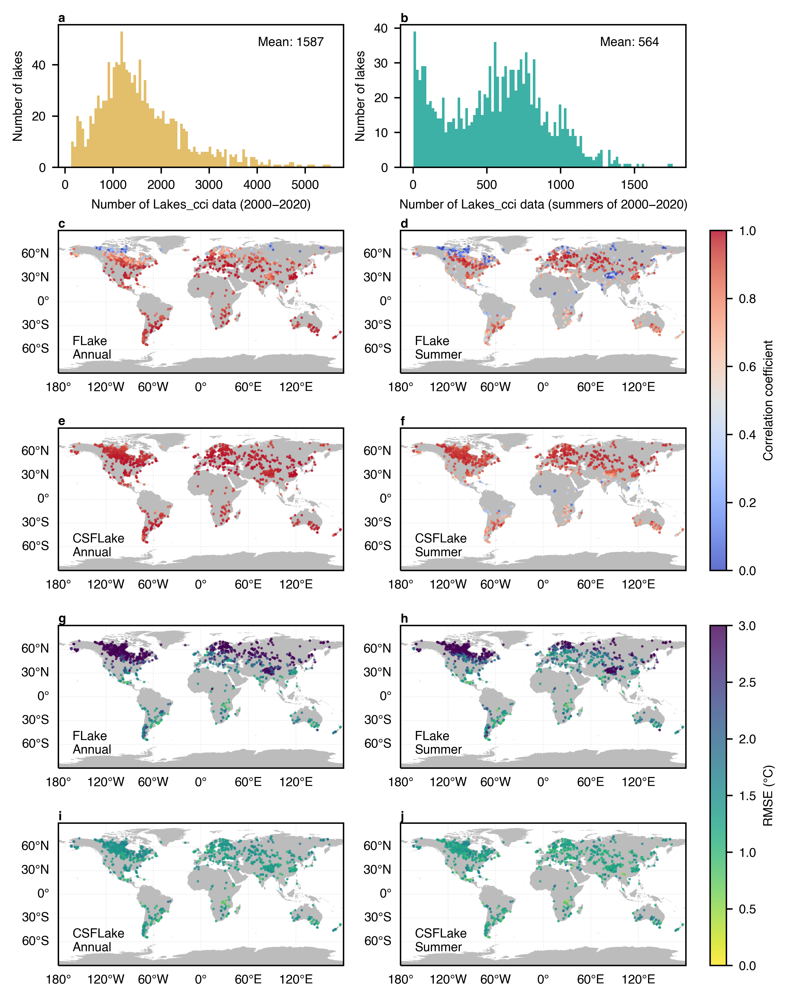

In [32]:
# start plotting
fig = plt.figure(figsize=(16/2.54, 25/2.54))
ax1 = plt.subplot(521, projection=proj)
ax2 = plt.subplot(522, projection=proj)
ax3 = plt.subplot(523, projection=proj)
ax4 = plt.subplot(524, projection=proj)
ax5 = plt.subplot(525, projection=proj)
ax6 = plt.subplot(526, projection=proj)
ax7 = plt.subplot(527, projection=proj)
ax8 = plt.subplot(528, projection=proj)

im1 = plot_basic(deflswt_metrics_annual['cc'], loc_vmin=0, loc_vmax=1, ax=ax1, loc_cbar_on=False, loc_cmap_name='coolwarm')
plot_basic(var_n=deflswt_metrics_north['cc'].values, var_s=deflswt_metrics_south['cc'].values, loc_vmin=0, loc_vmax=1, ax=ax2, loc_cbar_on=False, loc_cmap_name='coolwarm')
plot_basic(lswt_metrics_annual['cc'], loc_vmin=0, loc_vmax=1, ax=ax3, loc_cbar_on=False, loc_cmap_name='coolwarm')
plot_basic(var_n=lswt_metrics_north['cc'].values, var_s=lswt_metrics_south['cc'].values, loc_vmin=0, loc_vmax=1, ax=ax4, loc_cbar_on=False, loc_cmap_name='coolwarm')

im2 = plot_basic(deflswt_metrics_annual['rmse'], loc_vmin=0, loc_vmax=3, ax=ax5, loc_cbar_on=False, loc_cmap_name='viridis_r')
plot_basic(var_n=deflswt_metrics_north['rmse'].values, var_s=deflswt_metrics_south['rmse'].values, loc_vmin=0, loc_vmax=3, ax=ax6, loc_cbar_on=False, loc_cmap_name='viridis_r')
plot_basic(lswt_metrics_annual['rmse'], loc_vmin=0, loc_vmax=3, ax=ax7, loc_cbar_on=False, loc_cmap_name='viridis_r')
plot_basic(var_n=lswt_metrics_north['rmse'].values, var_s=lswt_metrics_south['rmse'].values, loc_vmin=0, loc_vmax=3, ax=ax8, loc_cbar_on=False, loc_cmap_name='viridis_r')

cbax1 = add_equal_axes([ax1, ax2, ax3, ax4], 'right', 0.03, h_width=0.02)
plt.colorbar(im1, cbax1, [ax1, ax2, ax3, ax4], orientation='vertical', label='Correlation coefficient')
cbax2 = add_equal_axes([ax5, ax6, ax7, ax8], 'right', 0.03, h_width=0.02)
plt.colorbar(im2, cbax2, [ax5, ax6, ax7, ax8], orientation='vertical', label='RMSE (\u00B0C)')

ax1.annotate('FLake\nAnnual', xy=(0.05, 0.1), xycoords='axes fraction')
ax2.annotate('FLake\nSummer', xy=(0.05, 0.1), xycoords='axes fraction')
ax3.annotate('CSFLake\nAnnual', xy=(0.05, 0.1), xycoords='axes fraction')
ax4.annotate('CSFLake\nSummer', xy=(0.05, 0.1), xycoords='axes fraction')
ax5.annotate('FLake\nAnnual', xy=(0.05, 0.1), xycoords='axes fraction')
ax6.annotate('FLake\nSummer', xy=(0.05, 0.1), xycoords='axes fraction')
ax7.annotate('CSFLake\nAnnual', xy=(0.05, 0.1), xycoords='axes fraction')
ax8.annotate('CSFLake\nSummer', xy=(0.05, 0.1), xycoords='axes fraction')

ax9 = add_equal_axes(ax1, 'top', 0.05)
ax9.hist(fsat_count_annual, bins=100, color='#e3be6b')
ax9.set_ylabel('Number of lakes')
ax9.set_xlabel('Number of Lakes_cci data (2000$-$2020)')
ax9.annotate('Mean: {:.0f}'.format(fsat_count_annual.mean()), xy=(0.7, 0.85), xycoords='axes fraction')
pass;

ax10 = add_equal_axes(ax2, 'top', 0.05)
tmpdf = fsat_count_summer * 1

ax10.hist(tmpdf, bins=100, color='#3db1a6')
ax10.set_ylabel('Number of lakes')
ax10.set_xlabel('Number of Lakes_cci data (summers of 2000$-$2020)')
ax10.annotate('Mean: {:.0f}'.format(tmpdf.mean()), xy=(0.7, 0.85), xycoords='axes fraction')
pass;

auto_label(ax9, ax10, ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8)


## Figure E3

In [91]:
with open(datadir + 'LSWT_validation_others.pkl', 'rb') as f:
    globolakes_tmp1, sharma, total_insitu_sim = pickle.load(f)

In [113]:
my_blues = shiftedColorMap(matplotlib.cm.Blues, start=0.1)

/tmp/ipykernel_9485/402618711.py:49: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=newcmap)


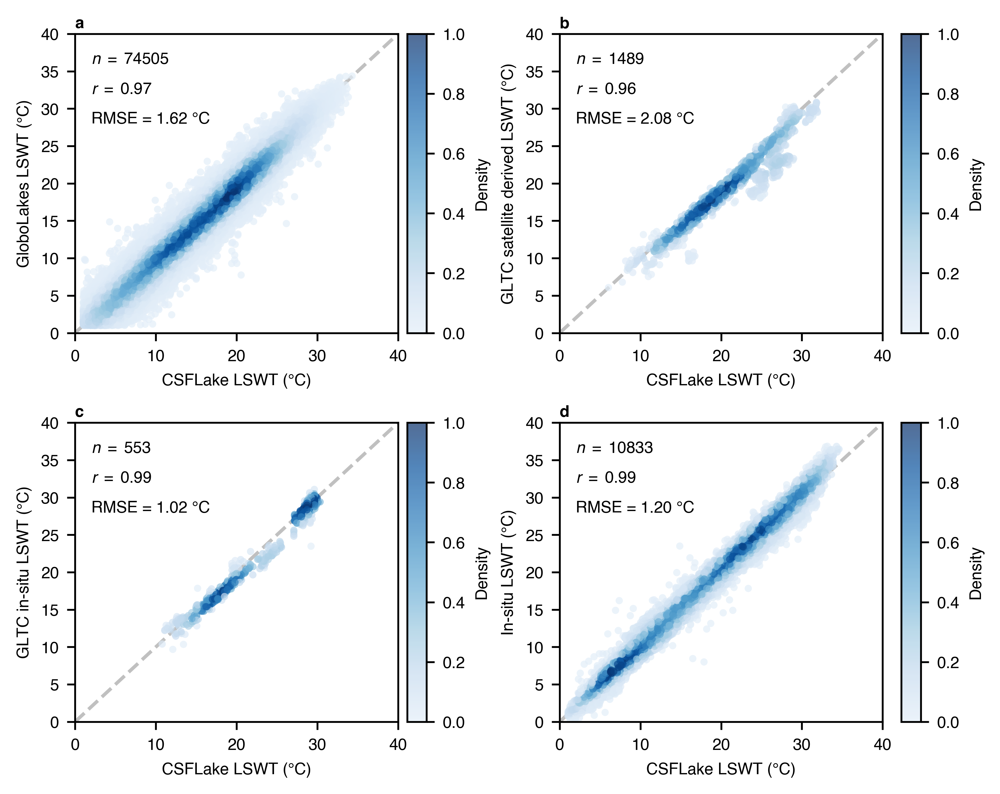

In [115]:
fig, axes = plt.subplots(2, 2, figsize=(16/2.54, 14/2.54))
plt.subplots_adjust(wspace=0.5, hspace=0.3)

plot_scatter(axes[0,0], sim=globolakes_tmp1['0ctl'].values-273.15, obs=globolakes_tmp1['0globolakes']-273.15, \
             loc_ylabel='GloboLakes LSWT', loc_cbar_on=True, loc_xlabel='CSFLake LSWT', loc_max=40, loc_s=10, \
             loc_cmap=my_blues)

plot_scatter(axes[0,1], sim=sharma.loc[sharma['variable']=='Lake_Temp_Summer_Satellite', 'simulation'], \
    obs=sharma.loc[sharma['variable']=='Lake_Temp_Summer_Satellite', 'value'], loc_cmap=my_blues, \
        loc_ylabel='GLTC satellite derived LSWT', loc_xlabel='CSFLake LSWT', loc_max=40, loc_s=10, loc_cbar_on=True, )

plot_scatter(axes[1,0], sim=sharma.loc[sharma['variable']=='Lake_Temp_Summer_InSitu', 'simulation'], \
    obs=sharma.loc[sharma['variable']=='Lake_Temp_Summer_InSitu', 'value'], loc_cmap=my_blues, \
        loc_ylabel='GLTC in-situ LSWT', loc_xlabel='CSFLake LSWT', loc_cbar_on=True,loc_max=40, loc_s=10)

plot_scatter(axes[1,1], sim=total_insitu_sim['simTemp'], obs=total_insitu_sim['obsTemp'], loc_cmap=my_blues, \
             loc_ylabel='In-situ LSWT', loc_xlabel='CSFLake LSWT', loc_max=40, loc_cbar_on=True, loc_s=10)

auto_label(axes[0,0], axes[0,1], axes[1,0], axes[1,1])
pdfpng(fig, 'fige3')

## Figure E5

In [15]:
# save([slope_lswt_ctl_cov, slope_lswt_cft_cov, lswt_ctl_cov, lswt_cft_cov], 'cov')
with open(datadir + 'cov_contribution.pkl', 'rb') as f:
    slope_lswt_ctl_cov, slope_lswt_cft_cov, lswt_ctl_cov, lswt_cft_cov, p_lswt_ctl_cov, p_lswt_cft_cov = pickle.load(f)

In [18]:
# Define function for string formatting of scientific notation
# Modified from https://stackoverflow.com/a/18313780/22838226
def sci_notation(num, decimal_digits=1, precision=None, exponent=None):
    """
    Returns a string representation of the scientific
    notation of the given number formatted for use with
    LaTeX or Mathtext, with specified number of significant
    decimal digits and precision (number of decimal digits
    to show). The exponent to be used can also be specified
    explicitly.
    """
    if exponent is None:
        exponent = int(np.floor(np.log10(abs(num))))
    coeff = round(num / float(10**exponent), decimal_digits)
    if precision is None:
        precision = decimal_digits

    return r"${0:.{2}f}\times10^{{{1:d}}}$".format(coeff, exponent, precision)

[]
[]
Mann_Kendall_Test(trend='increasing', h=True, p=0.0010872949889939587, z=3.26690672250062, Tau=0.34249471458773784, s=324.0, var_s=9775.333333333334, slope=2.091443590395385e-05, intercept=0.020991633772143258) Mann_Kendall_Test(trend='increasing', h=True, p=0.0016578303136334238, z=3.1455355749154577, Tau=0.3298097251585624, s=312.0, var_s=9775.333333333334, slope=1.4532997311746603e-05, intercept=0.019100024195099034)
Mann_Kendall_Test(trend='increasing', h=True, p=4.5807624833749117e-05, z=4.076047706401702, Tau=0.427061310782241, s=404.0, var_s=9775.333333333334, slope=5.0804475187911924e-05, intercept=0.024253766075324784) Mann_Kendall_Test(trend='increasing', h=True, p=2.4686446769894843e-05, z=4.217647378584392, Tau=0.4418604651162791, s=418.0, var_s=9775.333333333334, slope=3.994103230339427e-05, intercept=0.02212869462126265)
30.51212388186307


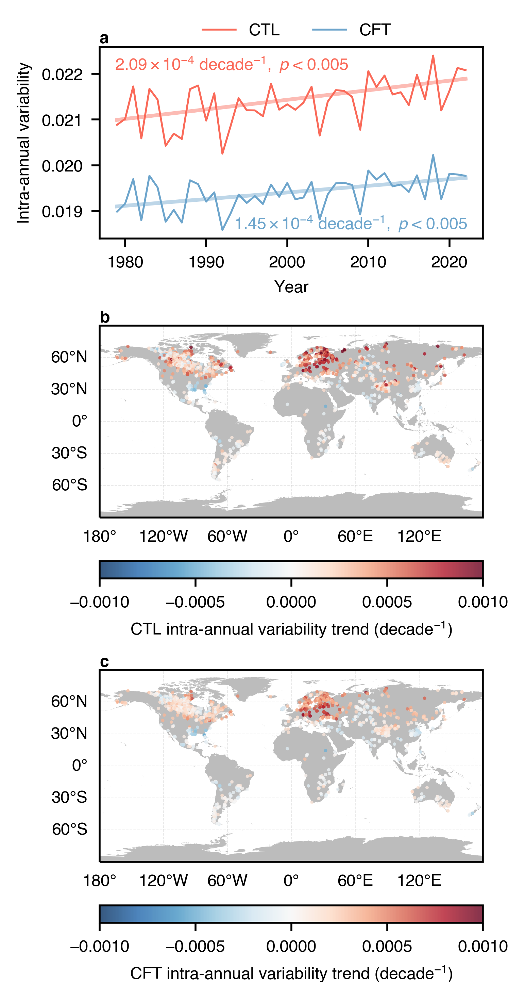

In [19]:
fig = plt.figure(figsize=(17/2.54, 13/2.54), dpi=500)
plt.subplots_adjust(wspace=0.3, hspace=0.1)
ax1 = plt.subplot(221, projection=proj)
ax2 = plt.subplot(223, projection=proj)
# linewidth1 = np.array([0.05 if p_lswt_ctl_cov[i]<0.05 else 0. for i in range(len(cali_lakeids))])
# linewidth2 = np.array([0.05 if p_lswt_cft_cov[i]<0.05 else 0. for i in range(len(cali_lakeids))])
linewidth1 = 0
linewidth2 = 0
print(slope_lswt_ctl_cov[slope_lswt_ctl_cov==0])
print(slope_lswt_cft_cov[slope_lswt_cft_cov==0])
plot_basic(slope_lswt_ctl_cov[slope_lswt_ctl_cov!=0]*10, ax=ax1, \
           loc_linewidth=linewidth1, powerlimits=False, loc_vmin=-0.001, loc_vmax=0.001, loc_cbar_on='horizontal', loc_cbar_title='CTL intra-annual variability trend (decade$^{-1}$)')
plot_basic(slope_lswt_cft_cov[slope_lswt_cft_cov!=0]*10, ax=ax2, loc_linewidth=linewidth1, powerlimits=False, loc_vmin=-0.001, loc_vmax=0.001, loc_cbar_on='horizontal', loc_cbar_title='CFT intra-annual variability trend (decade$^{-1}$)')

tmpmk1 = mk.original_test(lswt_ctl_cov.mean(axis=1))
tmpmk2 = mk.original_test(lswt_cft_cov.mean(axis=1))
print(tmpmk1, tmpmk2)
tmpmk3 = mk.original_test(lswt_ctl_cov.iloc[:,(lats>=35) & (lats<=70) & (lons>=-10) & (lons<=50)].mean(axis=1))
tmpmk4 = mk.original_test(lswt_cft_cov.iloc[:,(lats>=35) & (lats<=70) & (lons>=-10) & (lons<=50)].mean(axis=1))
print(tmpmk3, tmpmk4)

ax3 = add_equal_axes([ax1,], 'top', 0.1, )
ax3.plot(np.arange(1979,2023), lswt_ctl_cov.mean(axis=1), linewidth=0.8, c='#fa6a59', label='CTL')
ax3.plot(np.arange(1979,2023), lswt_cft_cov.mean(axis=1), linewidth=0.8, c='#6da5cc', label='CFT')
ax3.plot(np.arange(1979,2023), tmpmk1[7]*np.arange(0,2023-1979)+tmpmk1[8], alpha=0.45, linewidth=1.6, c='#fa6a59')
ax3.plot(np.arange(1979,2023), tmpmk2[7]*np.arange(0,2023-1979)+tmpmk2[8], alpha=0.45, linewidth=1.6, c='#6da5cc')
ax3.set_ylabel('Intra-annual variability',)
ax3.set_xlabel('Year')
ax3.annotate(
    # '{:+.2e} '.format(tmpmk1[7]*10) + 'decade$^{-1},\ p$ < 0.005',
    sci_notation(tmpmk1[7]*10, 2) + ' decade$^{-1},\ p$ < 0.005',
    xy=(0.04, 0.88), xycoords='axes fraction',
    color='#fa6a59'
    )
ax3.annotate(
    # '{:+.2e} '.format(tmpmk2[7]*10) + 'decade$^{-1},\ p$ < 0.005',
    sci_notation(tmpmk2[7]*10, 2) + ' decade$^{-1},\ p$ < 0.005',
    xy=(0.35, 0.05), xycoords='axes fraction',
    color='#6da5cc'
    )
ax3.legend(bbox_to_anchor=(0.8, 1.2), frameon=False, ncol=2)
auto_label(ax3, ax1, ax2)

# global contribution
print( (tmpmk1[7] - tmpmk2[7]) / tmpmk1[7] * 100 )

## Figure E7

In [37]:
with open(datadir + 'LHW_HTE_relationships.pkl', 'rb') as f:
    slope_hw_duration_ctl, slope_hw_intensity_ctl, slope_t_day_summ_yearmean, p_t_day_summ_yearmean, \
      slope_hot_days_annual_intensity, p_hot_days_annual_intensity, slope_hot_days_annual_count, \
            p_hot_days_annual_count, hw_duration_ctl, hw_intensity_ctl, clim_t_day_summ, \
                  hot_days_annual_intensity, hot_days_annual_count = pickle.load(f)

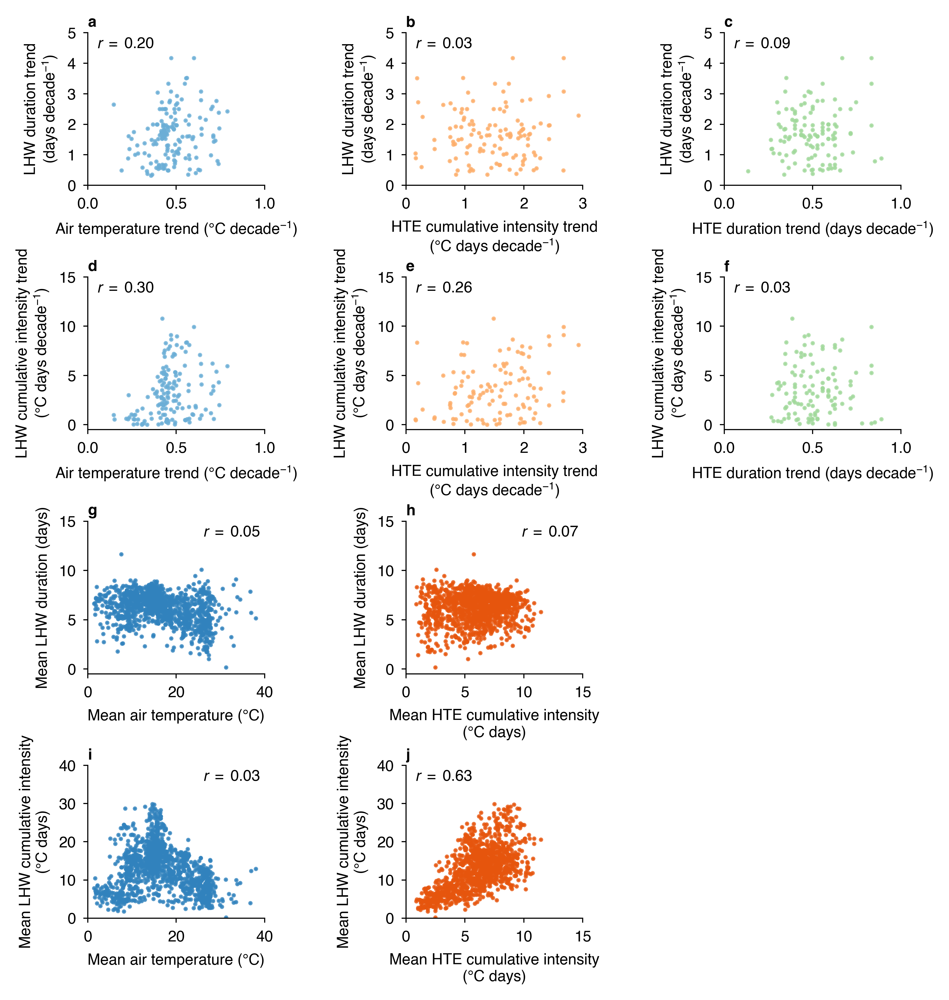

In [40]:
# plt.figure()
# ax1 = plt.subplot(431)
tmppal = sns.color_palette('tab20c')
fig, axes = plt.subplots(4,3,figsize=(17/2.54, 19/2.54))
plt.subplots_adjust(hspace=0.6, wspace=0.8)
for ax in axes.reshape(-1):
    ax.spines[['right', 'top']].set_visible(False)
    ax.spines[['left', 'bottom']].set_linewidth(0.5)
    ax.tick_params(width=0.5, length=2)

slopey1 = slope_hw_duration_ctl*10
slopey1[(slopey1==0)] = np.nan
# slopey1[(p_hw_duration_ctl>=0.05)|(slopey1==0)] = np.nan
slopey2 = slope_hw_intensity_ctl*10
slopey2[(slopey2==0)] = np.nan
# slopey2[(p_hw_intensity_ctl>=0.05)|(slopey2==0)] = np.nan
# slopey1 = ctl_diff_duration * 1
# slopey1[ctl_ks_duration>=0.05] = np.nan
# slopey2 = ctl_diff_intensity * 1
# slopey2[ctl_diff_intensity>=0.05] = np.nan

slopex1 = slope_t_day_summ_yearmean*10
slopex1[(p_t_day_summ_yearmean>=0.05)|(slopex1==0)] = np.nan 
slopex2 = slope_hot_days_annual_intensity*10
slopex2[(p_hot_days_annual_intensity>=0.05)|(slopex2==0)] = np.nan 
slopex3 = slope_hot_days_annual_count*10 
slopex3[(p_hot_days_annual_count>=0.05)|(slopex3==0)] = np.nan 

climy1 = hw_duration_ctl.mean(axis=0)
climy2 = hw_intensity_ctl.mean(axis=0)
climx1 = clim_t_day_summ - 273.15
climx2 = hot_days_annual_intensity.mean(axis=0)
climx3 = hot_days_annual_count.mean(axis=0)

# row 1: LHW duration趋势 vs 夏季气温趋势、HTE强度趋势、HTE时间趋势
axes[0,0].scatter(y=slopey1, x=slopex1, s=1, alpha=0.8, color=tmppal[1])
axes[0,0].set_ylabel('LHW duration trend\n(days decade$^{-1}$)')
axes[0,0].set_xlabel('Air temperature trend (\u00B0C decade$^{-1}$)')

axes[0,1].scatter(y=slopey1, x=slopex2, s=1, alpha=0.8, color=tmppal[6])
axes[0,1].set_xlabel('HTE cumulative intensity trend\n(\u00B0C days decade$^{-1}$)')
axes[0,1].set_ylabel('LHW duration trend\n(days decade$^{-1}$)')

axes[0,2].scatter(y=slopey1, x=slopex3, s=1, alpha=0.8, color=tmppal[10])
axes[0,2].set_xlabel('HTE duration trend (days decade$^{-1}$)')
axes[0,2].set_ylabel('LHW duration trend\n(days decade$^{-1}$)')

axes[0,0].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(slopey1), pd.DataFrame(slopex1))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)
axes[0,1].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(slopey1), pd.DataFrame(slopex2))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)
axes[0,2].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(slopey1), pd.DataFrame(slopex3))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)

# row 2: LHW intensity趋势 vs 夏季气温趋势、HTE强度趋势、HTE时间趋势
axes[1,0].scatter(y=slopey2, x=slopex1, s=1, alpha=0.8, color=tmppal[1])
axes[1,0].set_ylabel('LHW cumulative intensity trend\n(\u00B0C days decade$^{-1}$)')
axes[1,0].set_xlabel('Air temperature trend (\u00B0C decade$^{-1}$)')

axes[1,1].scatter(y=slopey2, x=slopex2, s=1, alpha=0.8, color=tmppal[6])
axes[1,1].set_ylabel('LHW cumulative intensity trend\n(\u00B0C days decade$^{-1}$)')
axes[1,1].set_xlabel('HTE cumulative intensity trend\n(\u00B0C days decade$^{-1}$)')

axes[1,2].scatter(y=slopey2, x=slopex3, s=1, alpha=0.8, color=tmppal[10])
axes[1,2].set_xlabel('HTE duration trend (days decade$^{-1}$)')
axes[1,2].set_ylabel('LHW cumulative intensity trend\n(\u00B0C days decade$^{-1}$)')

axes[1,0].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(slopey2), pd.DataFrame(slopex1))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)
axes[1,1].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(slopey2), pd.DataFrame(slopex2))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)
axes[1,2].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(slopey2), pd.DataFrame(slopex3))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)

# row 3: LHW duration气候态 vs 夏季气温气候态、HTE强度气候态、HTE时间气候态
axes[2,0].scatter(y=climy1, x=climx1, s=1, alpha=0.8, color=tmppal[0])
axes[2,0].set_ylabel('Mean LHW duration (days)')
axes[2,0].set_xlabel('Mean air temperature (\u00B0C)')

axes[2,1].scatter(y=climy1, x=climx2, s=1, alpha=0.8, color=tmppal[4])
axes[2,1].set_xlabel('Mean HTE cumulative intensity\n(\u00B0C days)')
axes[2,1].set_ylabel('Mean LHW duration (days)')
# axes[2,2].scatter(y=climy1, x=climx3, s=1, alpha=0.8, color=tmppal[8])

axes[2,0].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(climy1), pd.DataFrame(climx1))[0][0]), xy=(0.65, 0.9), xycoords='axes fraction',)
axes[2,1].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(climy1), pd.DataFrame(climx2))[0][0]), xy=(0.65, 0.9), xycoords='axes fraction',)
# axes[2,2].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(climy1), pd.DataFrame(climx3))[0][0]), xy=(0.65, 0.9), xycoords='axes fraction',)

# row 4: LHW intensity气候态 vs 夏季气温气候态、HTE强度气候态、HTE时间气候态
axes[3,0].scatter(y=climy2, x=climx1, s=1, alpha=0.8, color=tmppal[0])
axes[3,0].set_ylabel('Mean LHW cumulative intensity\n(\u00B0C days)')
axes[3,0].set_xlabel('Mean air temperature (\u00B0C)')

axes[3,1].scatter(y=climy2, x=climx2, s=1, alpha=0.8, color=tmppal[4])
axes[3,1].set_ylabel('Mean LHW cumulative intensity\n(\u00B0C days)')
axes[3,1].set_xlabel('Mean HTE cumulative intensity\n(\u00B0C days)')
# axes[3,2].scatter(y=climy2, x=climx3, s=1, alpha=0.8, color=tmppal[8])

axes[3,0].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(climy2), pd.DataFrame(climx1))[0][0]), xy=(0.65, 0.9), xycoords='axes fraction',)
axes[3,1].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(climy2), pd.DataFrame(climx2))[0][0]), xy=(0.05, 0.9), xycoords='axes fraction',)
# axes[3,2].annotate('$r\ =\ {:.2f}$'.format(cal_stats(pd.DataFrame(climy2), pd.DataFrame(climx3))[0][0]), xy=(0.65, 0.9), xycoords='axes fraction',)

axes[2,2].axis('off')
axes[3,2].axis('off')

# legend_lake_info1 = [
#     Line2D([0], [0], marker='o', color='none', 
#         markerfacecolor=tmppal[1], 
#         markeredgewidth=0., markersize=3,
#         label='Air temperature trend (\u00B0C decade$^{-1}$)'),
#     Line2D([0], [0], marker='o', color='none', 
#         markerfacecolor=tmppal[6], 
#         markeredgewidth=0., markersize=3,
#         label='HTE cumulative intensity trend (\u00B0C days decade$^{-1}$)'),
#     Line2D([0], [0], marker='o', color='none', 
#         markerfacecolor=tmppal[10], 
#         markeredgewidth=0., markersize=3,
#         label='HTE duration trend (days decade$^{-1}$)') ,
#     Line2D([0], [0], marker='o', color='none', 
#         markerfacecolor=tmppal[0], 
#         markeredgewidth=0., markersize=3,
#         label='Mean air temperature (\u00B0C)'),
#     Line2D([0], [0], marker='o', color='none', 
#         markerfacecolor=tmppal[4], 
#         markeredgewidth=0., markersize=3,
#         label='Mean HTE cumulative intensity (\u00B0C days)'),
    # Line2D([0], [0], marker='o', color='none', 
    #     markerfacecolor=tmppal[8], 
    #     markeredgewidth=0., markersize=2,
    #     label='HTE total annual days climatology (days; 1979-2022)'),
    # ]
# axes[3,1].legend(handles=legend_lake_info1, loc='center right', bbox_to_anchor=(2.6, 0.5), frameon=False, ncol=1, labelspacing=1.2)
# axes[3,1].legend(handles=legend_lake_info2, loc='center right', frameon=False, ncol=1)
# axes[3,0].get_legend()._legend_box.align = "baseline"
# axes[3,1].get_legend()._legend_box.align = "baseline"

for ax in [axes[0,0], axes[1,0]]:
    ax.set_xlim([0, 1])
for ax in [axes[0,1], axes[1,1]]:
    ax.set_xlim([0, 3])
for ax in [axes[0,2], axes[1,2]]:
    ax.set_xlim([0, 1])
for ax in [axes[2,0], axes[3,0]]:
    ax.set_xlim([0, 40])
for ax in [axes[2,1], axes[3,1]]:
    ax.set_xlim([0, 15])

for ax in axes[0,:].ravel():
    ax.set_ylim([0, 5])
for ax in axes[1,:].ravel():
    ax.set_ylim([-0.5, 15])
for ax in axes[2,:].ravel():
    ax.set_ylim([-0.5, 15])
for ax in axes[3,:].ravel():
    ax.set_ylim([0, 40])

auto_label(axes[0,0], axes[0,1], axes[0,2], axes[1,0], axes[1,1], axes[1,2], axes[2,0], axes[2,1], \
           axes[3,0], axes[3,1], offset=0.02)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

## Figure E4

In [117]:
with open(datadir + 'LHW_validation.pkl', 'rb') as f:
    tmpdf = pickle.load(f)[0]

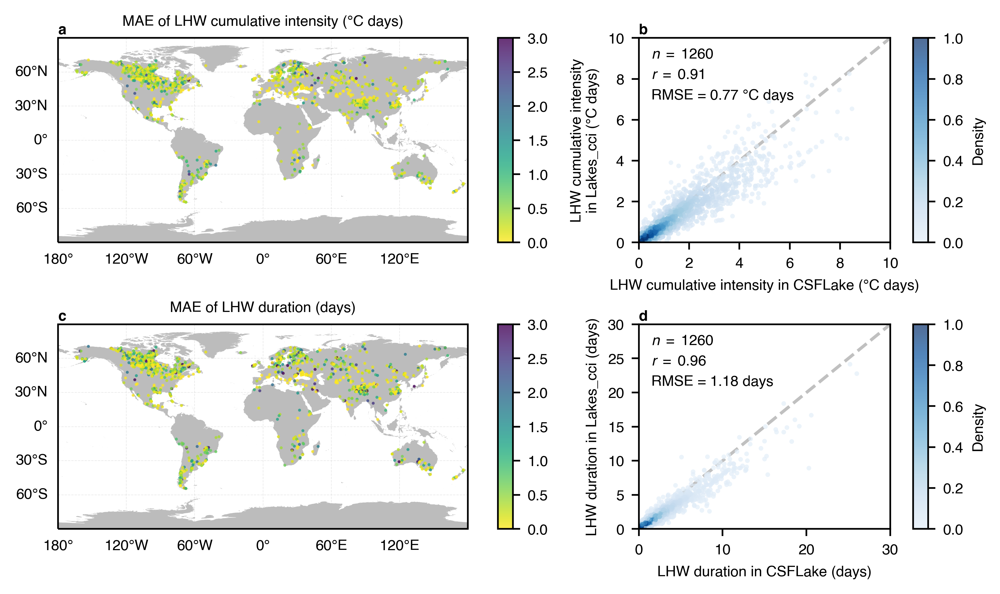

In [119]:
fig = plt.figure(figsize=(17/2.54, 11/2.54), dpi=500)
ax1 = plt.subplot(211, projection=proj)
ax2 = plt.subplot(212, projection=proj)
plt.subplots_adjust(hspace=0.4, wspace=0.2)

plot_basic(
    var_subset=tmpdf['intensity_mean'].values,
    lat_subset=lats[np.isin(cali_lakeids, tmpdf.index)],
    lon_subset=lons[np.isin(cali_lakeids, tmpdf.index)],
    ax=ax1,
    loc_cmap_name='viridis_r',
    loc_vmin=0,
    loc_vmax=3,
    loc_cbar_title='',
    )
ax1.set_title('MAE of LHW cumulative intensity (\u00B0C days)', fontsize=7)

plot_basic(
    var_subset=tmpdf['duration'].values,
    lat_subset=lats[np.isin(cali_lakeids, tmpdf.index)],
    lon_subset=lons[np.isin(cali_lakeids, tmpdf.index)],
    ax=ax2,
    loc_vmin=0,
    loc_vmax=3,
    loc_cmap_name='viridis_r',
    loc_cbar_title=''
    )
ax2.set_title('MAE of LHW duration (days)', fontsize=7)

ax3 = add_equal_axes(ax1, 'right', 0.17, h_width=0.25)
plot_scatter(
    obs=tmpdf['intensity_mean_sat'],
    sim=tmpdf['intensity_mean_sim'],
    loc_ax=ax3,
    loc_min=0,
    loc_max=10,
    loc_cbar_on=True,
    loc_s=5,
    loc_unit='\u00B0C days',
    loc_cmap=my_blues,
    loc_ylabel='LHW cumulative intensity\nin Lakes_cci',
    loc_xlabel='LHW cumulative intensity in CSFLake'
)
ax4 = add_equal_axes(ax2, 'right', 0.17, h_width=0.25)
plot_scatter(
    obs=tmpdf['duration_sat'],
    sim=tmpdf['duration_sim'],
    loc_ax=ax4,
    loc_unit='days',
    loc_cbar_on=True,
    loc_max=30,
    loc_s=5,
    loc_cmap=my_blues,
    loc_ylabel='LHW duration in Lakes_cci',
    loc_xlabel='LHW duration in CSFLake'
)
auto_label(ax1, ax3, ax2, ax4)
pdfpng(fig, 'fige4')

## Figure E6

In [43]:
with open(datadir + 'LHW_CTL.pkl', 'rb') as f:
    slope_hw_duration_ctl_annual, slope_hw_intensity_ctl_annual, slope_hw_duration_ctl, slope_hw_intensity_ctl = pickle.load(f)

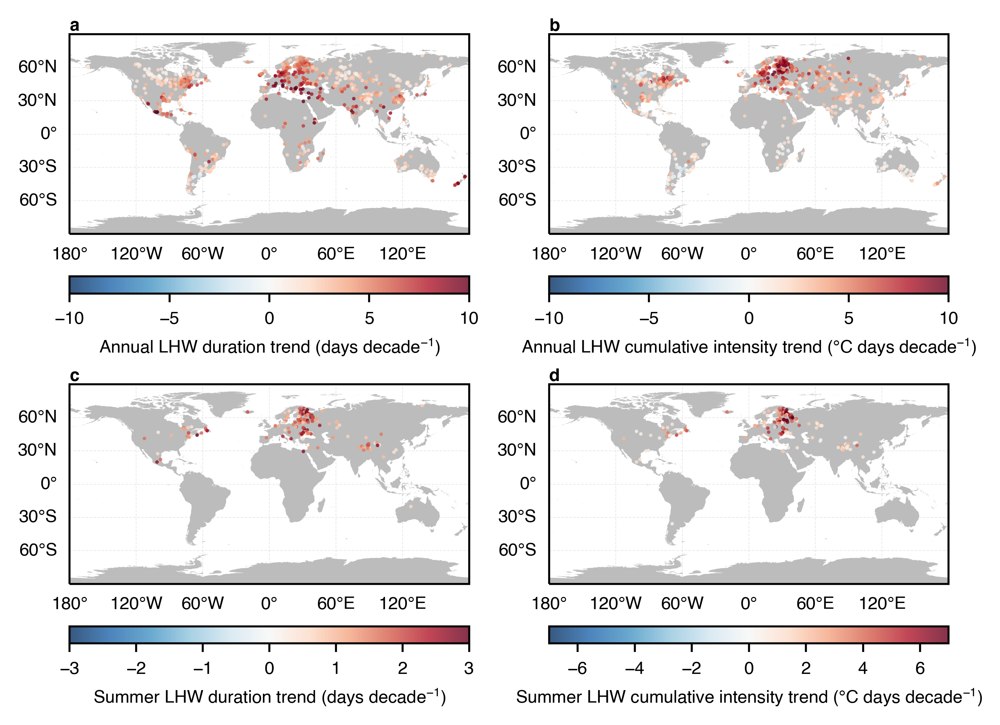

In [44]:
fig = plt.figure(figsize=(16/2.54, 12/2.54), dpi=500)
plt.subplots_adjust(hspace=0.2, )
ax1 = plt.subplot(221, projection=proj)
ax2 = plt.subplot(222, projection=proj)
ax3 = plt.subplot(223, projection=proj)
ax4 = plt.subplot(224, projection=proj)

plot_basic(slope_hw_duration_ctl_annual*10, ax=ax1, loc_vmin=-10, loc_vmax=10, loc_cbar_on=False)
plot_basic(slope_hw_intensity_ctl_annual*10, ax=ax2, loc_vmin=-10, loc_vmax=10, loc_cbar_on=False)
slope_hw_duration_ctl_annual[slope_hw_duration_ctl_annual==0] = np.nan
slope_hw_intensity_ctl_annual[slope_hw_intensity_ctl_annual==0] = np.nan
plot_basic(slope_hw_duration_ctl_annual*10, ax=ax1, loc_vmin=-10, loc_vmax=10, loc_cbar_title='Annual LHW duration trend (days decade$^{-1}$)', loc_cbar_on='horizontal')
plot_basic(slope_hw_intensity_ctl_annual*10, ax=ax2, loc_vmin=-10, loc_vmax=10, loc_cbar_title='Annual LHW cumulative intensity trend (\u00B0C days decade$^{-1}$)', loc_cbar_on='horizontal')

plot_basic(slope_hw_duration_ctl*10, ax=ax3, loc_vmin=-3, loc_vmax=3, loc_cbar_title='Summer LHW duration trend (days decade$^{-1}$)', loc_cbar_on='horizontal')
plot_basic(slope_hw_intensity_ctl*10, ax=ax4, loc_vmin=-7, loc_vmax=7, loc_cbar_title='Summer LHW cumulative intensity trend (\u00B0C days decade$^{-1}$)', loc_cbar_on='horizontal')
slope_hw_duration_ctl[slope_hw_duration_ctl==0] = np.nan
slope_hw_intensity_ctl[slope_hw_intensity_ctl==0] = np.nan
plot_basic(slope_hw_duration_ctl*10, ax=ax3, loc_vmin=-3, loc_vmax=3, loc_cbar_title='Summer LHW duration trend (days decade$^{-1}$)', loc_cbar_on='horizontal')
plot_basic(slope_hw_intensity_ctl*10, ax=ax4, loc_vmin=-7, loc_vmax=7, loc_cbar_title='Summer LHW cumulative intensity trend (\u00B0C days decade$^{-1}$)', loc_cbar_on='horizontal')

auto_label(ax1, ax2, ax3, ax4)

## Figure E8

In [20]:
# save([hw_duration_ctl, hw_duration_cft, hw_intensity_ctl, hw_intensity_cft], 'LHW_contribution')
with open(datadir + 'LHW_contribution.pkl', 'rb') as f:
    hw_duration_ctl, hw_duration_cft, hw_intensity_ctl, hw_intensity_cft = pickle.load(f)

34.58341159128223
2.8283976445386827e-06 6.768330153672508e-06
49.336436754802556


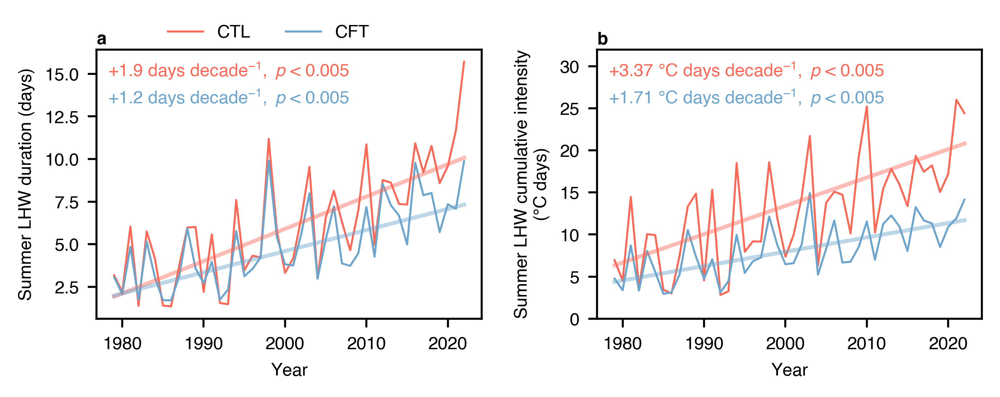

In [21]:
fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(16/2.54, 5/2.54), dpi=500)
plt.subplots_adjust(wspace=0.3)
tmpmk1 = mk.original_test(hw_duration_ctl.mean(axis=1))
tmpmk2 = mk.original_test(hw_duration_cft.mean(axis=1))
# print(tmpmk1[2], tmpmk2[2])
print((tmpmk1[-2]-tmpmk2[-2])/tmpmk1[-2]*100)
# ax3 = add_equal_axes(ax1, 'left', 0.06, h_width=0.35)
ax3.plot(np.arange(1979,2023), hw_duration_ctl.mean(axis=1), linewidth=0.8, c='#fa6a59', label='CTL')
ax3.plot(np.arange(1979,2023), hw_duration_cft.mean(axis=1), linewidth=0.8, c='#6da5cc', label='CFT')
ax3.plot(np.arange(1979,2023), tmpmk1[7]*np.arange(0,2023-1979)+tmpmk1[8], alpha=0.45, linewidth=1.6, c='#fa6a59')
ax3.plot(np.arange(1979,2023), tmpmk2[7]*np.arange(0,2023-1979)+tmpmk2[8], alpha=0.45, linewidth=1.6, c='#6da5cc')
ax3.set_ylabel('Summer LHW duration (days)',)
ax3.set_xlabel('Year')
ax3.annotate(
    '{:+.1f} '.format(tmpmk1[7]*10) + 'days decade$^{-1},\ p$ < 0.005',
    xy=(0.03, 0.90), xycoords='axes fraction',
    color='#fa6a59'
    )
ax3.annotate('{:+.1f} '.format(tmpmk2[7]*10) + 'days decade$^{-1},\ p$ < 0.005',
    xy=(
    0.03, 0.8), xycoords='axes fraction',
    color='#6da5cc'
    )
ax3.legend(bbox_to_anchor=(0.75, 1.15), frameon=False, ncol=2)

tmpmk3 = mk.original_test(hw_intensity_ctl.mean(axis=1))
tmpmk4 = mk.original_test(hw_intensity_cft.mean(axis=1))
print(tmpmk3[2], tmpmk4[2])
print((tmpmk3[-2]-tmpmk4[-2])/tmpmk3[-2]*100)
# CHECK P-VALUE!
# print(tmpmk1, tmpmk2, tmpmk3, tmpmk4)
# ax4 = add_equal_axes(ax2, 'left', 0.06, h_width=0.35)
ax4.plot(np.arange(1979,2023), hw_intensity_ctl.mean(axis=1), linewidth=0.8, c='#fa6a59')
ax4.plot(np.arange(1979,2023), hw_intensity_cft.mean(axis=1), linewidth=0.8, c='#6da5cc')
ax4.plot(np.arange(1979,2023), tmpmk3[7]*np.arange(0,2023-1979)+tmpmk3[8], alpha=0.45, linewidth=1.6, c='#fa6a59')
ax4.plot(np.arange(1979,2023), tmpmk4[7]*np.arange(0,2023-1979)+tmpmk4[8], alpha=0.45, linewidth=1.6, c='#6da5cc')
ax4.set_ylabel('Summer LHW cumulative intensity\n(\u00B0C days)',)
ax4.set_xlabel('Year')
ax4.annotate(
    '{:+.2f} '.format(tmpmk3[7]*10) + '\u00B0C days decade$^{-1},\ p$ < 0.005',
    xy=(0.03, 0.90), xycoords='axes fraction',
    # xy=(0.37, 0.05), xycoords='axes fraction',
    color='#fa6a59'
    )
ax4.annotate(
    '{:+.2f} '.format(tmpmk4[7]*10) + '\u00B0C days decade$^{-1},\ p$ < 0.005',
    xy=(0.03, 0.8), xycoords='axes fraction',
    # xy=(0.37, 0.05), xycoords='axes fraction',
    color='#6da5cc'
    )
ax4.set_ylim([0, 32])

auto_label(ax3, ax4)